# Udacity Self-Driving Car Nanodegree

# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Import Libraries

In [1]:
import numpy as np
import cv2

import pickle
import glob

# from ipywidgets import interact, interactive, fixed

from moviepy.editor import VideoFileClip
# from IPython.display import HTML

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

print('Done')

Done


## Camera Calibration

### 1. Briefly state how you computed the camera matrix and distortion coefficients. Provide an example of a distortion corrected calibration image.

In [2]:
def camera_calibraton(file_dir, file_name, nx, ny, img_size, display_mode = False):
    """
    Object: compute camera calibration matrix and distortion coefficients
    Parameters:
        file_dir
        file_name
        nx
        ny
        img_size
        display_mode: to draw chess board corners if it is True
    Return:
        mtx: calibration matrix of the camera
        dist: distortion coefficients
    """
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(9,6,0)
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = list()
    imgpoints = list()

    # Make a list of calibration images
    images = glob.glob('./' + file_dir + '/' + file_name + '*' + '.jpg')

    if display_mode is True:
        fig, axs = plt.subplots(5, 4, figsize=(16, 11))
        fig.subplots_adjust(hspace = .2, wspace=.001)
        axs = axs.ravel()

    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
            
            if display_mode is True:
                # Draw and display the corners
                img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
                axs[idx].axis('off')
                axs[idx].imshow(img)
            
    if (len(objpoints) == 0 or len(imgpoints) == 0):
        raise Error("Calibration Failed")
            
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
        
    return mtx, dist

In [3]:
def cal_undistort(img, mtx, dist):
    """
    Object: undistort image using camera calibration matrix from above
    Parameters:
        img
        mtx
        dist
    Return:
        img
    """
    img = cv2.undistort(img, mtx, dist, None, mtx)
    return img

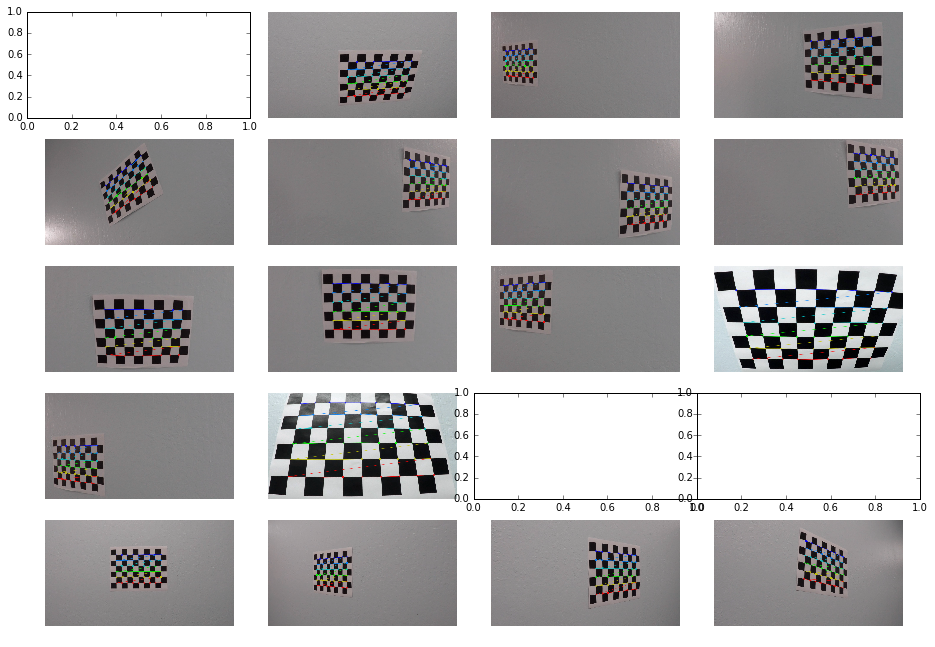

In [4]:
mtx, dist = camera_calibraton('camera_cal', 'calibration', 9, 6, (720, 1280), display_mode = True)

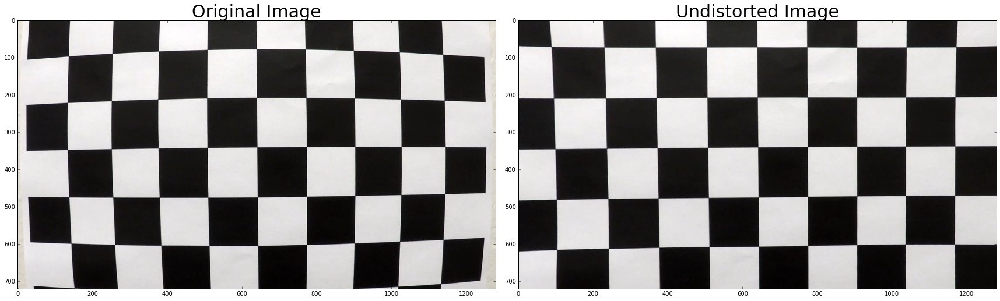

In [5]:
mtx, dist = camera_calibraton('camera_cal', 'calibration', 9, 6, (720, 1280))

test_img_1_dist = mpimg.imread("./camera_cal/calibration1.jpg")
test_img_1_undist = cal_undistort(test_img_1_dist, mtx, dist)

f, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img_1_dist)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(test_img_1_undist)
ax2.set_title('Undistorted Image', fontsize=30)

## Pipeline (single images)

### 1. Provide an example of a distortion-corrected image.

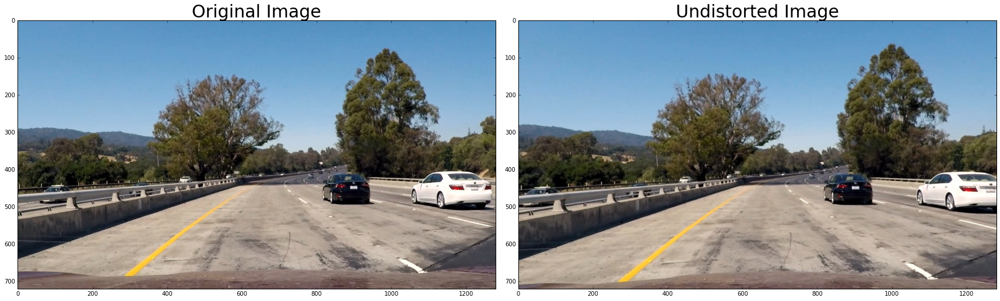

In [6]:
test_img = mpimg.imread('./test_images/test1.jpg')
test_img_undist = cal_undistort(test_img, mtx, dist)

f, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(test_img_undist)
ax2.set_title('Undistorted Image', fontsize=30)

### 3. Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image.

In [7]:
def unwarp(img, src, dst):
    """
    Object: apply a perspective transform
    """
    h,w = img.shape[:2]
    
    # 1) Compute the perspective transform, M, given source and destination points:
    M = cv2.getPerspectiveTransform(src, dst)
    
    # 2) Compute the inverse perspective transform:
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # 3) Warp an image using the perspective transform, M:
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    
    return warped, M, Minv

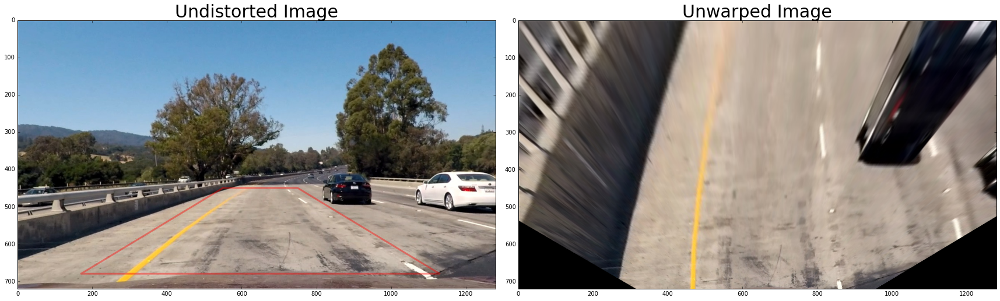

In [8]:
h,w = test_img_undist.shape[:2]

# define source and destination points for transform
src = np.float32([(550,450),
                  (750,450), 
                  (170,680), 
                  (1130,680)])
dst = np.float32([(400,0),
                  (w-400,0),
                  (400,h),
                  (w-400,h)])

test_img_unwarp, M, Minv = unwarp(test_img_undist, src, dst)

# Visualize unwarp
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
f.tight_layout()
ax1.imshow(test_img_undist)
x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
ax1.plot(x, y, color='red', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax1.set_xlim([0,w])
ax1.set_ylim([h,0])
ax1.set_title('Undistorted Image', fontsize=30)
ax2.imshow(test_img_unwarp)
ax2.set_title('Unwarped Image', fontsize=30)

### 2. Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image.  Provide an example of a binary image result.

#### Applying Sobel

In [9]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(25, 255)):
    """
    Object: Define a function that applies Sobel x or y, then takes an absolute value and applies a threshold.
    Parameters:
        img
        orient: must be 'x' or 'y'
        sobel_kernel
        thresh
    Return:
        binary_output
    """
    # Apply the following steps to img
    # 0) Check the input parameters
    assert(orient == 'x' or orient == 'y'), "Orientation must be x or y"
    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobel = cv2.Sobel(gray, cv2.CV_64F, orient=='x', orient=='y')
    
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # 5) Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    
    # 6) Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    return binary_output

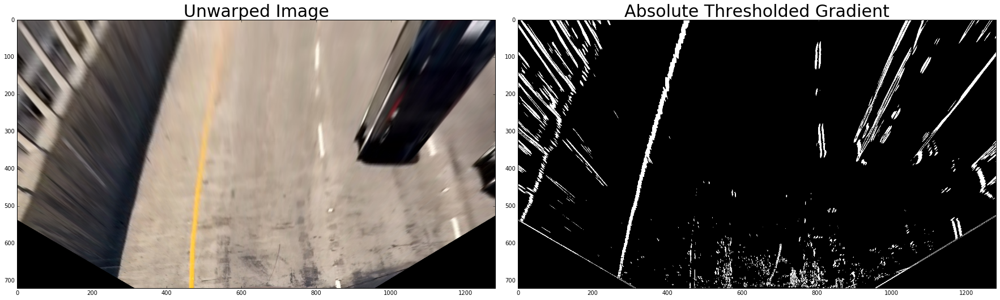

In [10]:
# Run the function
grad_binary = abs_sobel_thresh(test_img_unwarp, orient='x', thresh=(20, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img_unwarp)
ax1.set_title('Unwarped Image', fontsize=30)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Absolute Thresholded Gradient', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Magnitude of the Gradient

In [11]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    """
    Object: Define a function to return the magnitude of the gradient for a given sobel kernel size and threshold values
    """
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    
    # 4) Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    
    # 5) Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

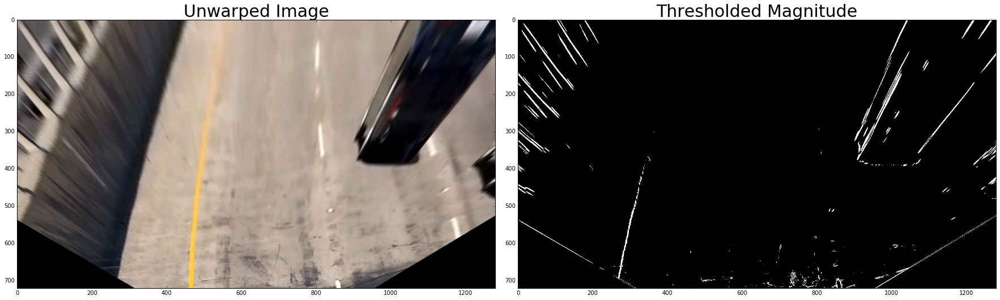

In [12]:
# Run the function
mag_binary = mag_thresh(test_img_unwarp, sobel_kernel=3, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img_unwarp)
ax1.set_title('Unwarped Image', fontsize=30)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Direction of the Gradient

In [13]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    """
    Object: Define a function to threshold an image for a given range and Sobel kernel
    """
    # 1) Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Take the absolute value of the gradient direction, apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

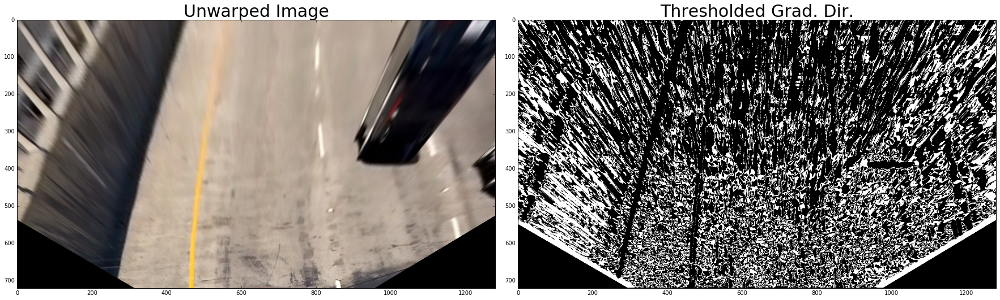

In [14]:
# Run the function
dir_binary = dir_threshold(test_img_unwarp, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img_unwarp)
ax1.set_title('Unwarped Image', fontsize=30)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### Color Transforms

In [15]:
def channel_isolate(img,channel):
    """
    Object: Takes in an RBG image and isolate channgel of R, G, B, H, S, V, L, or U
    Parameters:
        img
        channel: must be either R, G, B, H, S, V, L, or U
    Return:
        isolated channel
    """
    if (channel == 'R'):
        return img[:,:,0]
    
    elif (channel == 'G'):
        return img[:,:,1]
    
    elif (channel == 'B'):
        return img[:,:,2]
    
    elif (channel == 'H'):
        HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        return HSV[:,:,0]
    
    elif (channel == 'S'):
        HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        return HSV[:,:,1]
        
    elif (channel == 'V'):
        HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        return HSV[:,:,2]
        
    elif (channel == 'L'):
        HLS = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        return HLS[:,:,1]
    
    elif (channel == 'U'):
        LUV = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
        return LUV[:,:,2]
    
    else:
        raise Error("Channel must be either R, G, B, H, S, V, L, or U")
        
def channel_threshold(channel, threshold):
    """
    Object: Takes in one channel of an RBG image and get the value with a threshold
    Parameters:
        img
        channel: must be either R, G, B, H, S, V, L, or U
    Return:
        isolated channel with the threshold
    """
    retval, binary = cv2.threshold(channel.astype('uint8'), threshold[0], threshold[1], cv2.THRESH_BINARY)
    
    return binary

def color_transform(img):
    """
    Object: highlight lane lines by color isolation
    """
    binary_R = channel_threshold(channel=channel_isolate(img,'R'), threshold=(220,255))
    
    binary_V = channel_threshold(channel_isolate(img,'V'),(220,255))        
    
    HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    binary_yellow = cv2.inRange(HSV, (20, 100, 100), (50, 255, 255))

    sensitivity_1 = 68
    binary_white_1 = cv2.inRange(HSV, (0,0,255-sensitivity_1), (255,20,255))

    sensitivity_2 = 60
    HSL = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    binary_white_2 = cv2.inRange(HSL, (0,255-sensitivity_2,0), (255,255,sensitivity_2))

    binary_white_3 = cv2.inRange(img, (200,200,200), (255,255,255))

    binary = binary_R | binary_V | binary_yellow | binary_white_1 | binary_white_2 | binary_white_3
    
    return binary

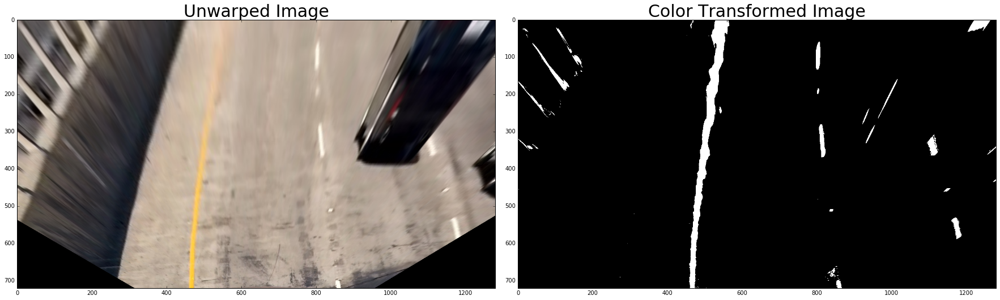

In [16]:
# Run the function
binary = color_transform(test_img_unwarp)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img_unwarp)
ax1.set_title('Unwarped Image', fontsize=30)
ax2.imshow(binary, cmap='gray')
ax2.set_title('Color Transformed Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [17]:
def hls_lthresh(img, thresh=(220, 255)):
    """
    Object: thresholds the L-channel of HLS
    """
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_l = hls[:,:,1]
    hls_l = hls_l*(255/np.max(hls_l))
    # 2) Apply a threshold to the L channel
    binary = np.zeros_like(hls_l)
    binary[(hls_l > thresh[0]) & (hls_l <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary

def lab_bthresh(img, thresh=(190,255)):
    """
    Object: thresholds the L-channel of HLS
    """
    # 1) thresholds the B-channel of LAB
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    # don't normalize if there are no yellows in the image
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    # 2) Apply a threshold to the L channel
    binary = np.zeros_like(lab_b)
    binary[((lab_b > thresh[0]) & (lab_b <= thresh[1]))] = 1
    # 3) Return a binary image of threshold result
    return binary

def color_transform_v2(img):
    """
    Object: highlight lane lines by color isolation
    """
    # HLS L-channel Threshold (using default parameters)
    binary_L = hls_lthresh(img)

    # Lab B-channel Threshold (using default parameters)
    binary_B = lab_bthresh(img)
    
    # Combine HLS and Lab B channel thresholds
    binary = np.zeros_like(binary_B)
    binary[(binary_L == 1) | (binary_B == 1)] = 1
    
    return binary

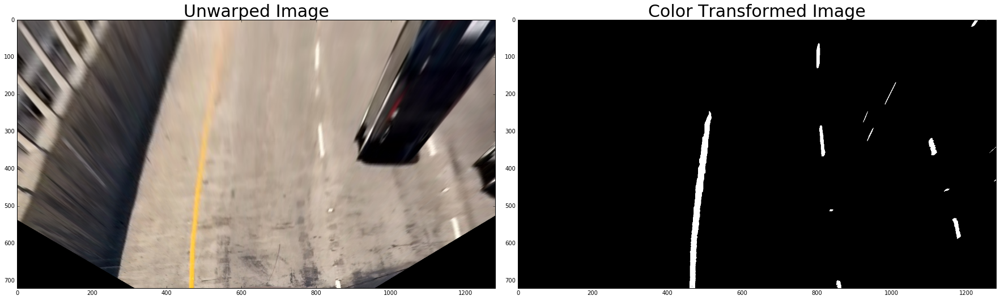

In [18]:
# Run the function
binary2 = color_transform_v2(test_img_unwarp)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img_unwarp)
ax1.set_title('Unwarped Image', fontsize=30)
ax2.imshow(binary2, cmap='gray')
ax2.set_title('Color Transformed Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### 4. Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?

In [19]:
def polyfit_by_current_frame(binary_warped, display_mode = False):
    """
    Object: Define method to fit polynomial to binary image with lines extracted, using sliding window
    """
    # 1) Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    if display_mode is True:
        # Create an output image to draw on and visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    
    # 2) Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    quarter_point = np.int(midpoint//2)
    leftx_base = np.argmax(histogram[quarter_point:midpoint]) + quarter_point
    rightx_base = np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint

    # 3.1) HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 10
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40

    # 3.2) Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # 3.3) Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Rectangle data for visualization
    rectangle_data = []

    # 4) Step through the windows one by one
    for window in range(nwindows):
        # 4.1) Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        
        if display_mode is True:
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),
            (win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),
            (win_xright_high,win_y_high),(0,255,0), 2) 

        # 4.2) Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                           (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # 4.3) Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # 4.4) If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # 5) Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # 6) Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # 7) Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    if display_mode is True:
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty

        ## Visualization ##
        # Colors in the left and right lane regions
        out_img[lefty, leftx] = [255, 0, 0]
        out_img[righty, rightx] = [0, 0, 255]
        
        plt.imshow(out_img)

        # Plots the left and right polynomials on the lane lines
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        
        h,w = out_img.shape[:2]
        plt.xlim([0,w])
        plt.ylim([h,0])

    return left_fit, right_fit, left_lane_inds, right_lane_inds

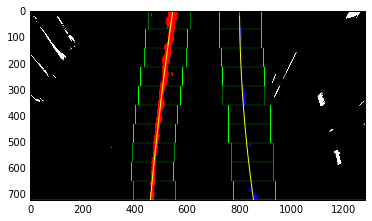

In [20]:
# Run the function
left_fit, right_fit, left_lane_inds, right_lane_inds = polyfit_by_current_frame(binary, display_mode = True)

In [21]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    # 1) Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # 2) Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    # 3) Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def polyfit_by_previous_frame(binary_warped, left_fit_prev, right_fit_prev, display_mode = False):
    # 1) HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = 80

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # 2) Set the area of search based on activated x-values ###
    # within the +/- margin of our polynomial function ###
    # Hint: consider the window areas for the similarly named variables ###
    # in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + 
                    left_fit_prev[2] - margin)) & (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + 
                    left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + 
                    right_fit_prev[2] - margin)) & (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + 
                    right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))
    
    # 3) Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # 4) Fit a second order polynomial to each using `np.polyfit`
    if lefty.size == 0 or leftx.size == 0 or righty.size == 0 or rightx.size == 0:
        return None, None, None, None
    else:
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
    
    # 5) Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    if display_mode is True:
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        
        plt.imshow(result)

        # Plot the polynomial lines onto the image
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        
        h,w = result.shape[:2]
        plt.xlim([0,w])
        plt.ylim([h,0])
        ## End visualization steps ##
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds

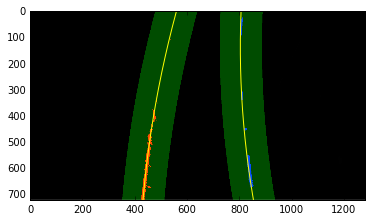

In [22]:
# Load our image - this should be a new frame since last time!
test_img_2 = mpimg.imread('./test_images/test5.jpg')
test_img_2_undist = cal_undistort(test_img_2, mtx, dist)
test_img_2_unwarp, M, Minv = unwarp(test_img_2_undist, src, dst)
binary_2 = color_transform(test_img_2_unwarp)

# Run image through the pipeline
# Note that in your project, you'll also want to feed in the previous fits
left_fit_2, right_fit_2, left_lane_inds_2, right_lane_inds_2 = polyfit_by_previous_frame(binary_warped = binary_2, 
                                                                            left_fit_prev = left_fit, 
                                                                            right_fit_prev = right_fit, 
                                                                            display_mode = True)

### 5. Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center.

In [23]:
def calc_curv_rads_and_cntr_dist(img, left_fit, right_fit, left_lane_inds, right_lane_inds):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # 1) Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # 2) Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    h, w = img.shape[:2]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
    
    # 3) Grab activated pixels
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # 3) Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # 4) Calculation of R_curve (radius of curvature)
    if len(leftx) != 0 and len(rightx) != 0:
        # 4.1) Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        
        # 4.2) Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        
    # 5) Calculation of distance from center, that is, image x_midpoint - mean of left_fit and r_fit intercepts 
    if right_fit is not None and left_fit is not None:
        car_position = img.shape[1]/2
        left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
        right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
        lane_center_position = (right_fit_x_int + left_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix

    return left_curverad, right_curverad, center_dist

In [24]:
left_curverad, right_curverad, center_dist = calc_curv_rads_and_cntr_dist(binary, left_fit, right_fit, left_lane_inds, right_lane_inds)

print('Radius of curvature:', left_curverad, 'm,', right_curverad, 'm')
print('Distance from lane center:', center_dist, 'm')

Radius of curvature: 4898.18799749 m, 1774.18241725 m
Distance from lane center: -0.0895383915597 m


### 6. Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.

In [25]:
def project_lane_area_and_data(img_undist, binary_warped, left_fit, right_fit, Minv, 
                               left_curverad, right_curverad, center_dist):
    
    img = np.copy(img_undist)
    if left_fit is None or right_fit is None:
        return img_undist
    
    # 1) Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # 2) Get the value of ploty and left_fitx, right_fitx
    h,w = binary_warped.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # 3) Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # 4) Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # 5) Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    
    # 6) Combine the result with the original image
    result = cv2.addWeighted(img_undist, 1, newwarp, 0.5, 0)
    
    # 7) Project curvature radius to the original image
    font = cv2.FONT_HERSHEY_DUPLEX
    curv_rad = (left_curverad + right_curverad) / 2
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(result, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    
    # 8) Project distance from center to the original image
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(result, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    
    return result

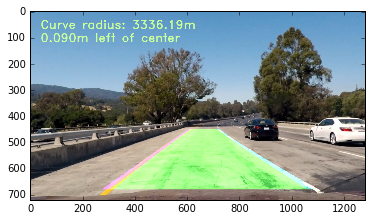

In [26]:
test_img_project = project_lane_area_and_data(test_img_undist, binary, left_fit, right_fit, Minv,
                                             left_curverad, right_curverad, center_dist)
plt.imshow(test_img_project)

## Pipeline (video)

### 1. Provide a link to your final video output.  Your pipeline should perform reasonably well on the entire project video (wobbly lines are ok but no catastrophic failures that would cause the car to drive off the road!).

In [27]:
def pipeline_v1(img):
    
    new_img = np.copy(img)
    
    img_undist = cal_undistort(new_img, mtx, dist)
    
    h,w = test_img_undist.shape[:2]
    # define source and destination points for transform
    src = np.float32([(550,450),
                      (750,450), 
                      (170,680), 
                      (1130,680)])
    dst = np.float32([(400,0),
                      (w-400,0),
                      (400,h),
                      (w-400,h)])
    img_unwarp, M, Minv = unwarp(img_undist, src, dst) 
    
    img_binary = color_transform(img_unwarp)    

    left_fit, right_fit, left_lane_inds, right_lane_inds = polyfit_by_current_frame(img_binary)

    left_curverad, right_curverad, center_dist = calc_curv_rads_and_cntr_dist(img_binary, 
                                                                                  left_fit,
                                                                                  right_fit,
                                                                                  left_lane_inds, 
                                                                                  right_lane_inds)
        
    result = project_lane_area_and_data(img_undist,                                            
                                            img_binary, 
                                            left_fit, 
                                            right_fit, 
                                            Minv, 
                                            left_curverad, 
                                            right_curverad, 
                                            center_dist)
        

    return result    

#### Test on some images

In [28]:
test_img_1 = mpimg.imread('./test_images/test6.jpg')
test_img_2 = mpimg.imread('./test_images/test4.jpg')
test_img_3 = mpimg.imread('./test_images/test1.jpg')
test_img_4 = mpimg.imread('./test_images/test5.jpg')

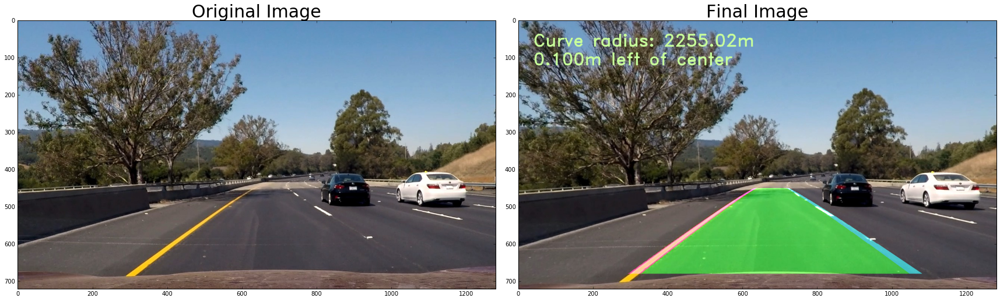

In [29]:
result1 = pipeline_v1(test_img_1)

f, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img_1)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(result1)
ax2.set_title('Final Image', fontsize=30)

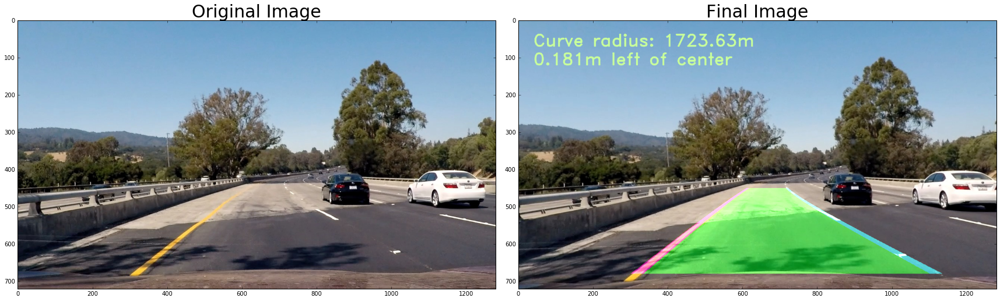

In [30]:
result2 = pipeline_v1(test_img_2)

f, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img_2)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(result2)
ax2.set_title('Final Image', fontsize=30)

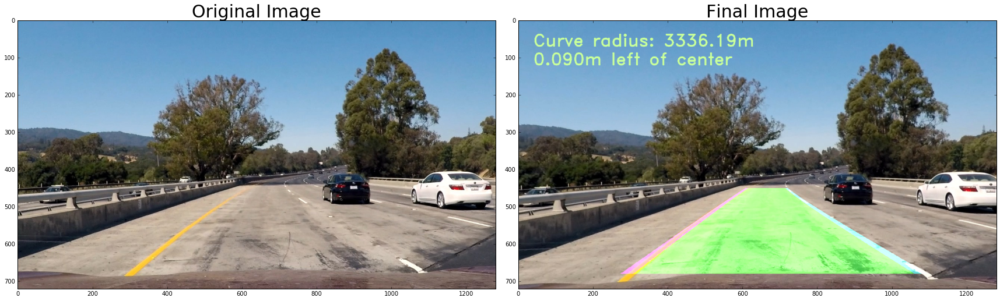

In [31]:
result3 = pipeline_v1(test_img_3)

f, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img_3)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(result3)
ax2.set_title('Final Image', fontsize=30)

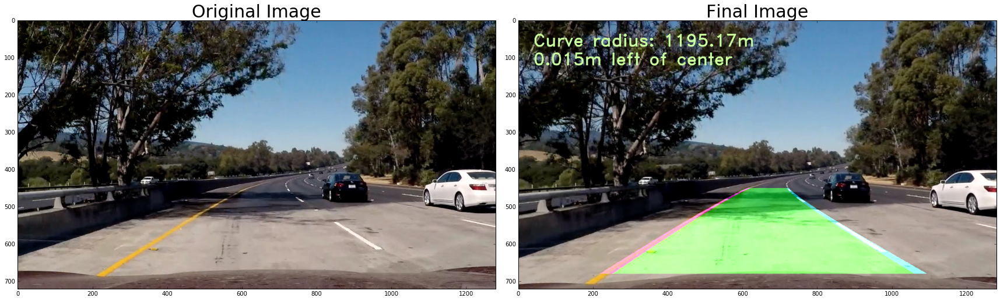

In [32]:
result4 = pipeline_v1(test_img_4)

f, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img_4)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(result4)
ax2.set_title('Final Image', fontsize=30)

In [33]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    
    def add_new_line(self, fit, lane_inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # check the difference
                self.diffs = abs(fit-self.best_fit)
            # drop the bad fit or accept the good fit
            if (self.diffs[0] > 0.001 or self.diffs[1] > 1.0 or self.diffs[2] > 100.) and len(self.current_fit) > 0:
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(lane_inds)
                self.current_fit.append(fit)
                # just keep the most 5 recent results
                if len(self.current_fit) > 5:                        
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # or remove one from the history, if not found
        else:
            self.detected = False
            # throw out oldest fit
            if len(self.current_fit) > 0:                
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            # if there are still any fits in the queue, best_fit is their average
            if len(self.current_fit) > 0:                
                self.best_fit = np.average(self.current_fit, axis=0)

In [34]:
def pipeline_v2(img):
    
    new_img = np.copy(img)
    
    img_undist = cal_undistort(new_img, mtx, dist)
    
    h,w = test_img_undist.shape[:2]
    # define source and destination points for transform
    src = np.float32([(550,450),
                      (750,450), 
                      (170,680), 
                      (1130,680)])
    dst = np.float32([(400,0),
                      (w-400,0),
                      (400,h),
                      (w-400,h)])
    img_unwarp, M, Minv = unwarp(img_undist, src, dst) 
    
    img_binary = color_transform(img_unwarp)
    
    if not left_line.detected or not right_line.detected:
        left_fit, right_fit, left_lane_inds, right_lane_inds = polyfit_by_current_frame(img_binary)
    else:
        left_fit, right_fit, left_lane_inds, right_lane_inds = polyfit_by_previous_frame(binary_warped = img_binary, 
                                                                            left_fit_prev = left_line.best_fit, 
                                                                            right_fit_prev = right_line.best_fit)

    # invalidate both fits if the difference in their x-intercepts isn't around 350 px (+/- 100 px)
    if left_fit is not None and right_fit is not None:
        # calculate x-intercept (bottom of image, x=image_height) for fits
        left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
        right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
        x_int_diff = abs(right_fit_x_int-left_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            left_fit = None
            right_fit = None
            
    left_line.add_new_line(left_fit, left_lane_inds)
    right_line.add_new_line(right_fit, right_lane_inds)
    
    # draw the current best fit if it exists
    if left_line.best_fit is not None and right_line.best_fit is not None:
        left_curverad, right_curverad, center_dist = calc_curv_rads_and_cntr_dist(img_binary, 
                                                                                  left_line.best_fit,
                                                                                  right_line.best_fit,
                                                                                  left_lane_inds, 
                                                                                  right_lane_inds)
        
        result = project_lane_area_and_data(img_undist,                                            
                                            img_binary, 
                                            left_line.best_fit, 
                                            right_line.best_fit, 
                                            Minv, 
                                            left_curverad, 
                                            right_curverad, 
                                            center_dist)
    else:
        result = new_img
        

    return result    

In [35]:
left_line = Line()
right_line = Line()

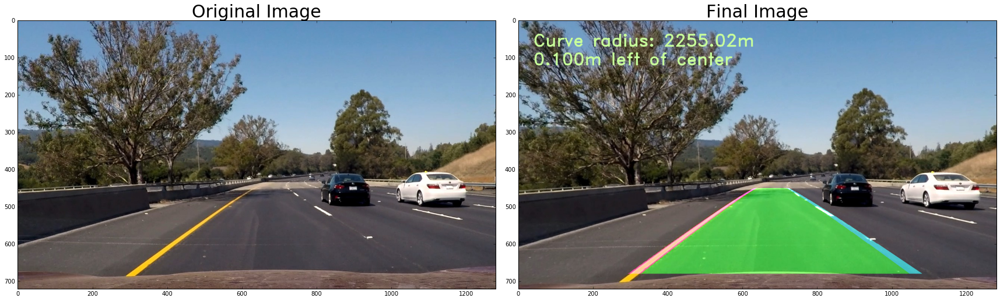

In [36]:
result1 = pipeline_v2(test_img_1)

f, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img_1)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(result1)
ax2.set_title('Final Image', fontsize=30)

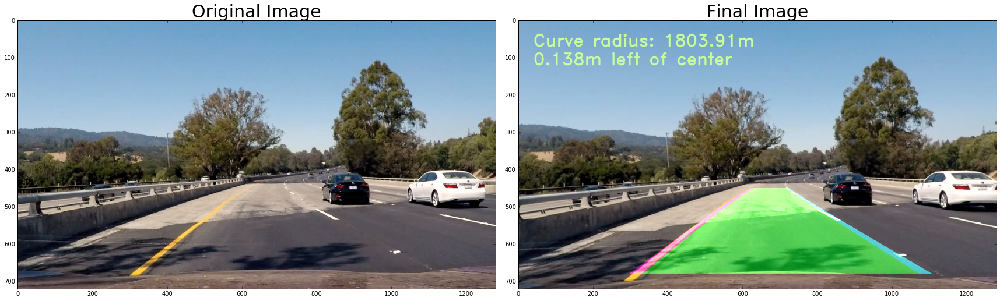

In [37]:
result2 = pipeline_v2(test_img_2)

f, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img_2)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(result2)
ax2.set_title('Final Image', fontsize=30)

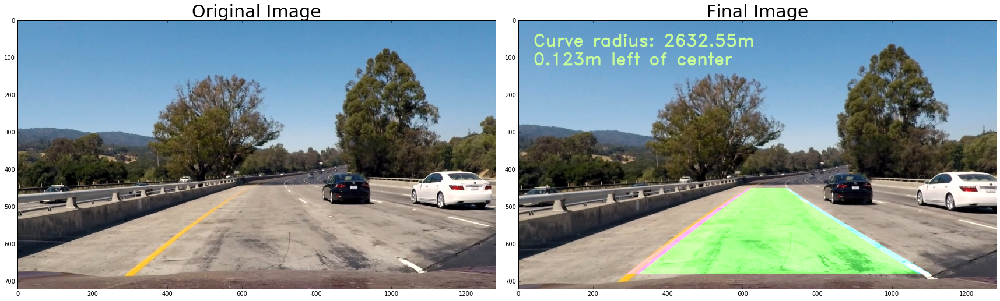

In [38]:
result3 = pipeline_v2(test_img_3)

f, ((ax1, ax2)) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img_3)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(result3)
ax2.set_title('Final Image', fontsize=30)

#### Project Video

In [39]:
left_line = Line()
right_line = Line()

video_input = VideoFileClip('project_video.mp4')
video_output = 'project_video_output.mp4'

processed_video = video_input.fl_image(pipeline_v2)
%time processed_video.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [04:30<00:00,  4.66it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 4min 32s
